In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [2]:
# from google.colab import files
# files.upload()

In [3]:
# !pip install -q kaggle
# !mkdir -p ~/.kaggle
# !cp kaggle.json ~/.kaggle/

In [4]:
cd '/content/gdrive/My Drive/medicine/malaria'

/content/gdrive/My Drive/medicine/malaria


In [5]:
# !kaggle datasets download -d kmader/malaria-bounding-boxes
# !unzip -q malaria-bounding-boxes.zip

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import os
import matplotlib.image as mpimg
from sklearn.preprocessing import LabelEncoder
import random
from matplotlib import patches
import shutil
from plotly.offline import iplot
%matplotlib inline
! pip install plotly==4.0.0

In [7]:
#Loading the training json file
train_json = open('/content/gdrive/My Drive/medicine/malaria/training.json')
test_json = open('/content/gdrive/My Drive/medicine/malaria/test.json')

In [8]:
training_data = json.load(train_json)
testing_data = json.load(test_json)

In [9]:
#Seperating each coloumns and classes with respective of its coloumn names
clean_training_data= []
for i in training_data:
    pathname = i['image']['pathname']
    for j in i['objects']:
        category = j['category']
        boundingbox = j['bounding_box']
        datas = boundingbox['maximum']['c'],boundingbox['maximum']['r'],boundingbox['minimum']['c'],boundingbox['minimum']['r'],category,pathname
        clean_training_data.append(datas)

In [10]:
#Assigning it into coloumn name
columns_name = ['minimum_c','minimum_r','maximum_c','maximum_r','category','path']
final_data = pd.DataFrame(clean_training_data)
final_data.columns = columns_name

In [11]:
#Converting into csv file from dataframe. Use it while you want to save your final data into csv file
final_data.to_csv('training_malaria.csv',index=False)

In [12]:
#Repeating it for the testing set
clean_testing_data= []
for i in testing_data:
    pathname = i['image']['pathname']
    for j in i['objects']:
        category = j['category']
        boundingbox = j['bounding_box']
        datas = boundingbox['maximum']['c'],boundingbox['maximum']['r'],boundingbox['minimum']['c'],boundingbox['minimum']['r'],category,pathname
        clean_testing_data.append(datas)

In [13]:
columns_name = ['minimum_c','minimum_r','maximum_c','maximum_r','category','path']
test_data = pd.DataFrame(clean_testing_data)
test_data.columns = columns_name

In [14]:
#Converting into csv file from testing json file
test_data.to_csv('testing_malaria.csv',index=False)

# **Exploitory data Analysis**

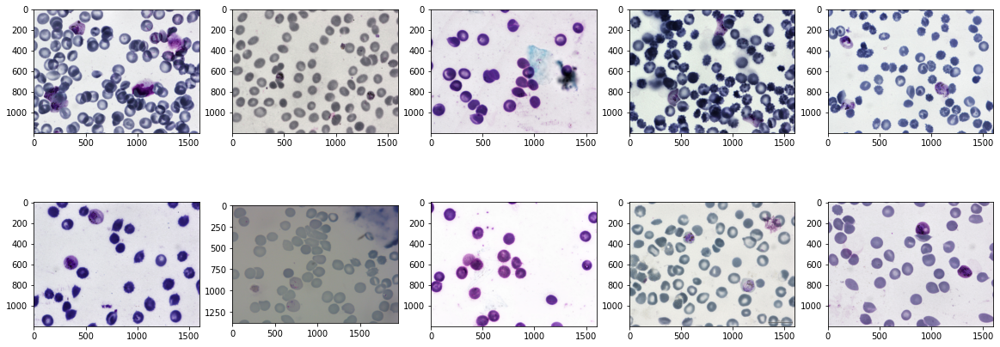

In [15]:
#Observing images from the folder
image_directory = '/content/gdrive/My Drive/medicine/malaria/images'
image_path = os.listdir(image_directory)
figure = plt.figure(figsize = (20,20))
cols = 5
rows = 5
for i in range(10):
    filepath = os.path.join(image_directory,random.choice(image_path))
    ax1 = figure.add_subplot(rows,cols,i+1)
    image = mpimg.imread(filepath)
    plt.imshow(image)
    
plt.show()

In [16]:
#Visualisation of distribution of weeks using offline plotly.
## The pandas dataframe object does not have the iplot method when it isn't linked to plotly.
# We need cufflinks to link pandas to plotly and add the iplot method
#Solution for linking from : https://stackoverflow.com/questions/65763648/dataframe-object-has-no-attribute-iplot
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [17]:
#Use this function to plot interactive plotly graph. 
#Source : https://stackoverflow.com/questions/47230817/plotly-notebook-mode-with-google-colaboratory
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

#### Distribution of different diseases alongside Red Blood Cells in the whole dataset
- Red Blood Cells count is 83.034K 
- Trophozoite cell counts is 1584 
- 446 difficult cell counts
- 522 ring cell counts
- 190 schizont cell counts 
- 156 gametocyte cell counts
-  103 leukocyte cell counts  

In [18]:
#Importing the csv file for both training and testing file
training_malaria = pd.read_csv('training_malaria.csv')
testing_malaria = pd.read_csv('testing_malaria.csv')

In [19]:
#Concatening the whole dataset
whole_dataset = pd.concat([training_malaria,testing_malaria],ignore_index=True,axis = 0)

In [20]:
configure_plotly_browser_state()
whole_dataset['category'].iplot(kind='hist',
                        bins=100, xTitle='Infections', yTitle='Frequencies', 
                        linecolor='white',opacity=0.7,
                        color='rgb(0, 200, 200)', theme='white',
                        bargap=0.01, title='Distribution of different diseases alongside Red Blood Cells')

### Distribution of diseases in training set


#### Distribution of different diseases alongside Red Blood Cells in the training dataset
- Red Blood Cells count is 77.42 K
- Trophozoite cell counts is 1473
- 441 difficult cell counts
- 353 ring cell counts
- 179 schizont cell counts 
- 144 gametocyte cell counts
- 103 leukocyte cell counts  

In [21]:
configure_plotly_browser_state()
training_malaria['category'].iplot(kind='hist',
                        bins=100, xTitle='Infections', yTitle='Frequencies', 
                        linecolor='white',opacity=0.7,
                        color='rgb(0, 200, 200)', theme='white',
                        bargap=0.01, title='Distribution of different diseases alongside Red Blood Cells')

### Distribution of diseases in testing set
- Red Blood Cells count is 5614
- Trophozoite cell counts is 111
- 5 difficult cell counts
- 169 ring cell counts
- 11 schizont cell counts 
- 12 gametocyte cell counts

In [22]:
configure_plotly_browser_state()
testing_malaria['category'].iplot(kind='hist',
                        bins=100, xTitle='Infections', yTitle='Frequencies', 
                        linecolor='white',opacity=0.7,
                        color='rgb(0, 200, 200)', theme='white',
                        bargap=0.01, title='Distribution of different diseases alongside Red Blood Cells')

#### Importing the dataset 

In [23]:
#Importing csv file
dataset = pd.read_csv('malaria.csv')

The total number of bounding boxes:  67
The total number of RBC:  63
Total number of Trophozites:  2
Total number of rings:  0
Total number of difficult cells:  2
Total number of Schizont cells:  0
Total number of gametocyte cells:  0


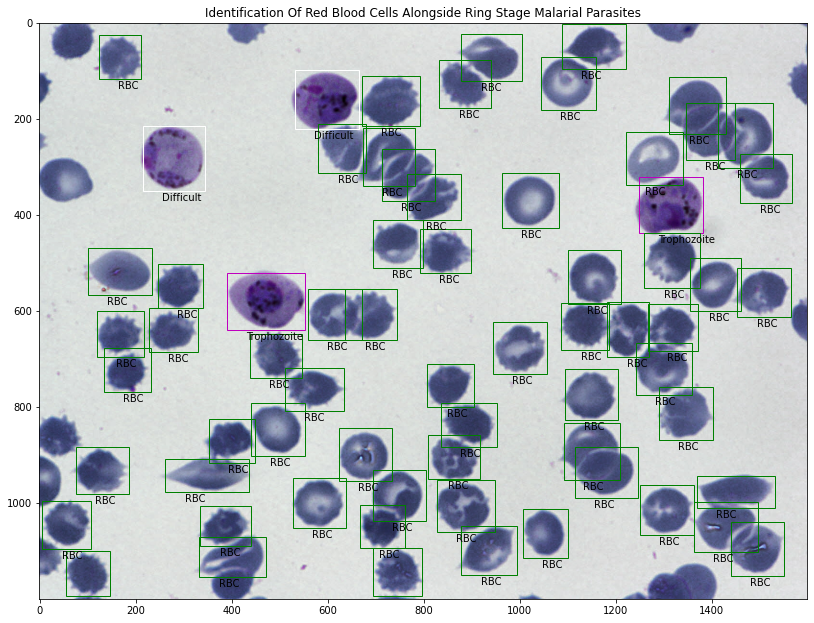

In [24]:
#Matching the bounding boxes with the picture and see the visualisation
fig = plt.figure()
ax = fig.add_axes([1,1,2,2])

image = plt.imread('/content/gdrive/My Drive/medicine/malaria/images/3e36698f-8c09-4c8b-8948-737310bf97e5.png')
plt.imshow(image)

bb = 0
rbc = 0
trop = 0
rings = 0
difficult = 0
sch = 0
game = 0
for _,row in dataset[dataset.path=='/images/3e36698f-8c09-4c8b-8948-737310bf97e5.png'].iterrows(): #Iterating through this image rows
    xaxis_minimum = row.minimum_c #Coordinates of X1
    xaxis_maximum = row.maximum_c #Coordinates of X2
    yaxis_minimum = row.minimum_r #Coordinates of Y1
    yaxis_maximum = row.maximum_r #Coordinates of Y2
    
    l = xaxis_maximum - xaxis_minimum
    b = yaxis_maximum - yaxis_minimum
    
    if row.category =='red blood cell':
        color = 'g'
        ax.annotate('RBC',xy = (xaxis_maximum+40,yaxis_minimum+20))
        rbc = rbc+1
    elif row.category =='trophozoite':
        color='m'
        ax.annotate('Trophozoite',xy=(xaxis_maximum+40,yaxis_minimum+20))
        trop = trop+1
    elif row.category =='ring':
        color='r'
        ax.annotate('Ring',xy=(xaxis_maximum+40,yaxis_minimum+20))
        rings = rings+1
    elif row.category =='difficult':
        color='w'
        ax.annotate('Difficult',xy=(xaxis_maximum+40,yaxis_minimum+20))
        difficult = difficult + 1
    elif row.category =='schizont':
        color='y'
        ax.annotate('Schizont',xy=(xaxis_maximum+40,yaxis_minimum+20))
        sch = sch + 1
    elif row.category =='gametocyte':
        color='b'
        ax.annotate('Gametocyte',xy=(xaxis_maximum+40,yaxis_minimum+20))
        game = game+1
    
    ax.title.set_text('Identification Of Red Blood Cells Alongside Ring Stage Malarial Parasites')
    
    rectangle = patches.Rectangle((xaxis_minimum,yaxis_minimum),l, b,edgecolor = color,facecolor = 'none')
    bb = bb + 1
    ax.add_patch(rectangle)

print('The total number of bounding boxes: ',bb)
print('The total number of RBC: ',rbc)
print('Total number of Trophozites: ',trop)
print('Total number of rings: ',rings)
print('Total number of difficult cells: ',difficult)
print('Total number of Schizont cells: ',sch)
print('Total number of gametocyte cells: ',game)

#### Moving the whole images from image folder into training and testing folder respectively

In [25]:
#Converting testing image destination into lists
testImage_list = list(testing_malaria['path'])
test_list_final = []

#Extracting the testing images name from the whole path 
for i in testImage_list:
  temp = i.split('/')
  temp = temp[-1]
  test_list_final.append(temp)

In [26]:
#Converting the image dataset folder into list
image_dataset = os.listdir('/content/gdrive/My Drive/medicine/malaria/images/')
image_dataset = list(image_dataset)

In [27]:
#Taking the testing images from the whole dataset into the testing folder
# for i in test_list_final:
#   if i in image_dataset:
#     src = os.path.join('/content/gdrive/My Drive/medicine/malaria/images',i)
#     destination = os.path.join('/content/gdrive/My Drive/medicine/malaria/testing_images',i)
#     shutil.copyfile(src,destination)